In [2]:
import sys
import os
import glob
import gsw
import numpy as np
import pandas as pd
import xarray as xr
import cmocean.cm as cm
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.ticker as ticker
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.gridliner as gridliner
# Add the current directory to the system path
sys.path.append('/g/data/jk72/zc0441')
from zpackage.zclef import Zlook,Zsearch

In [3]:
Time_range = ['1979','2014']
Model = 'ACCESS-CM2' #'IPSL-CM6A-LR' # 'EC-Earth3'  # 'IPSL-CM6A-LR' # 'EC-Earth3' 
save_fig_trigger = True
model_list = ['ACCESS-CM2',
             'CNRM-CM6-1',
             'CNRM-CM6-1-HR',
             'CNRM-ESM2-1',
             'FGOALS-f3-L',
             'FGOALS-g3',
             'IPSL-CM6A-LR',
             'IPSL-CM6A-LR-INCA',
             'NorESM2-LM',
             'NorESM2-MM',
             'UKESM1-0-LL']

tr_xlim = (25,28.2)


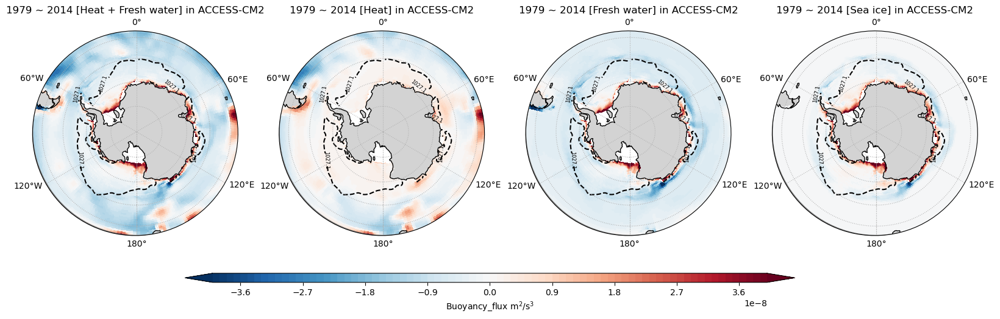

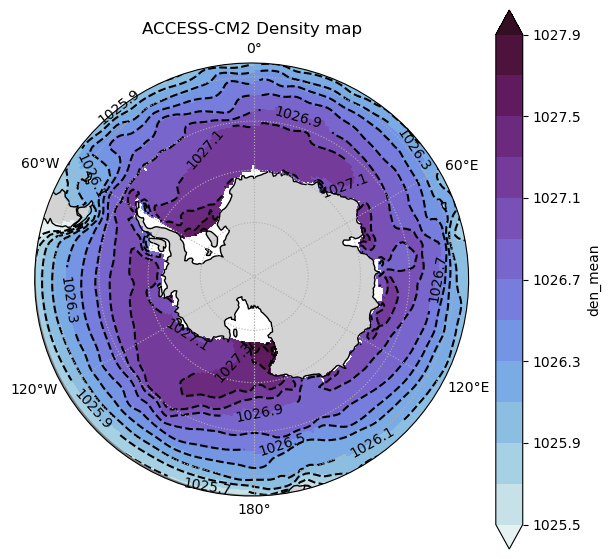

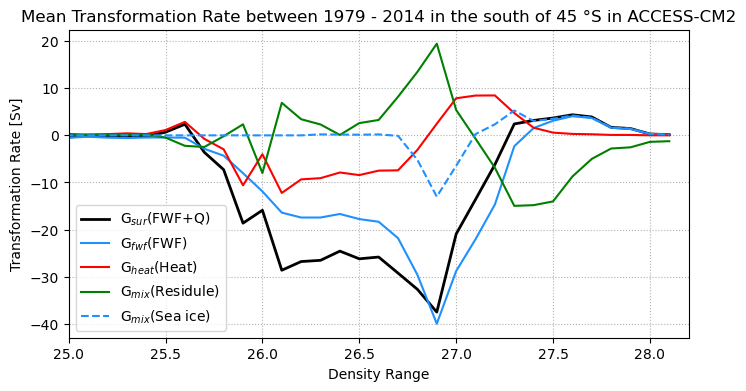

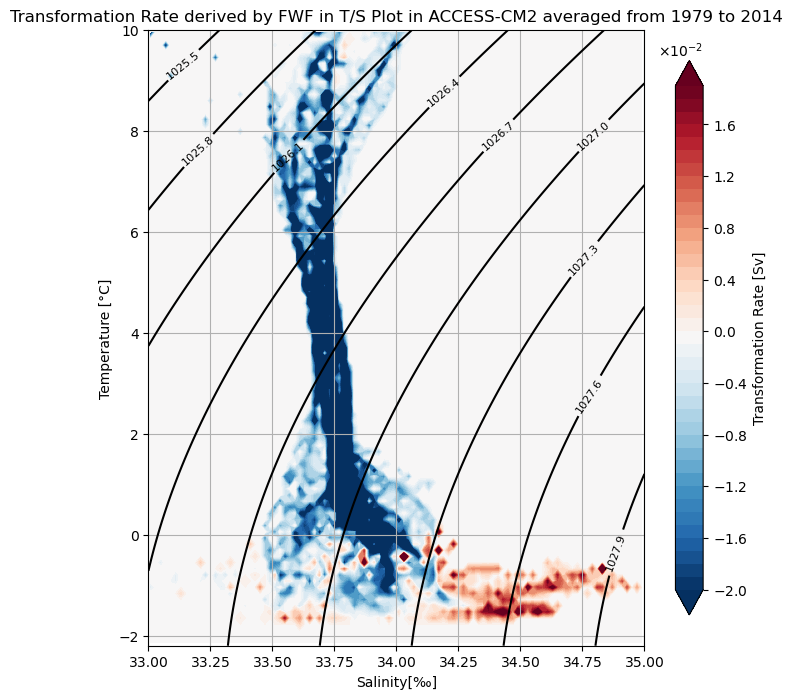

<Figure size 640x480 with 0 Axes>

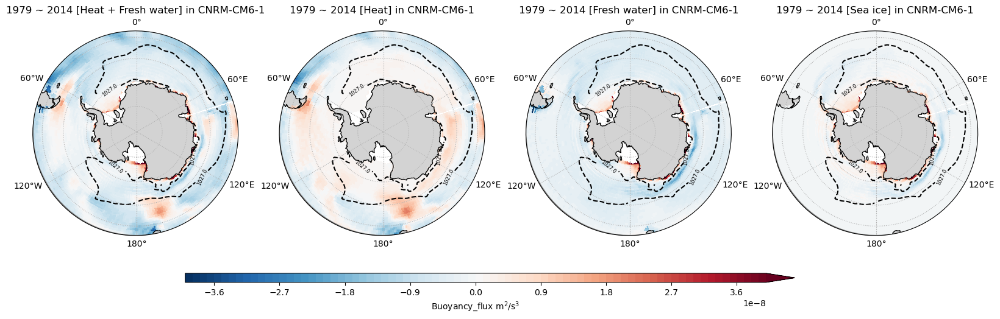

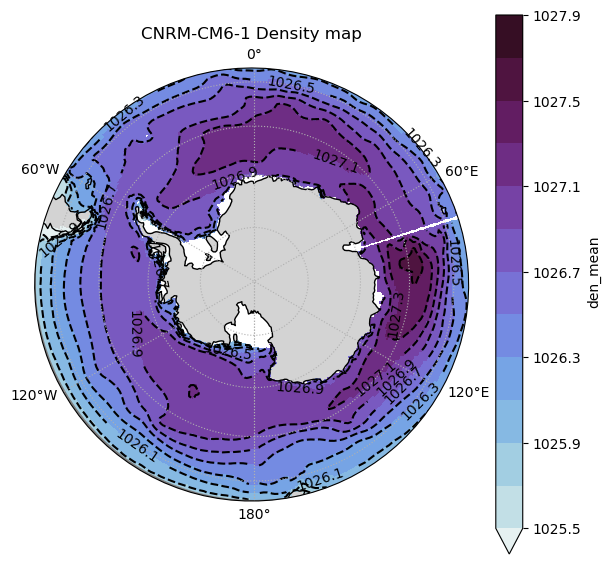

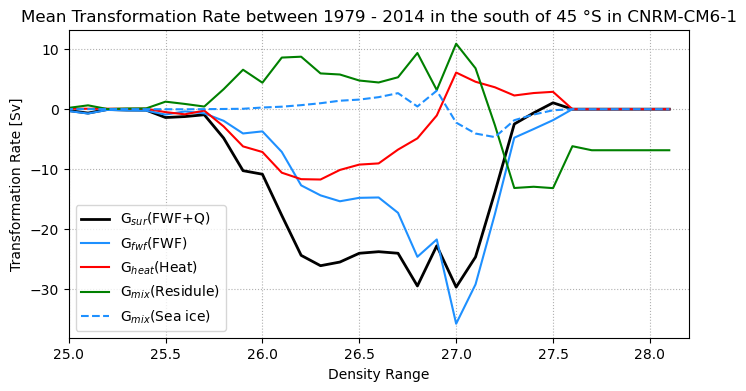

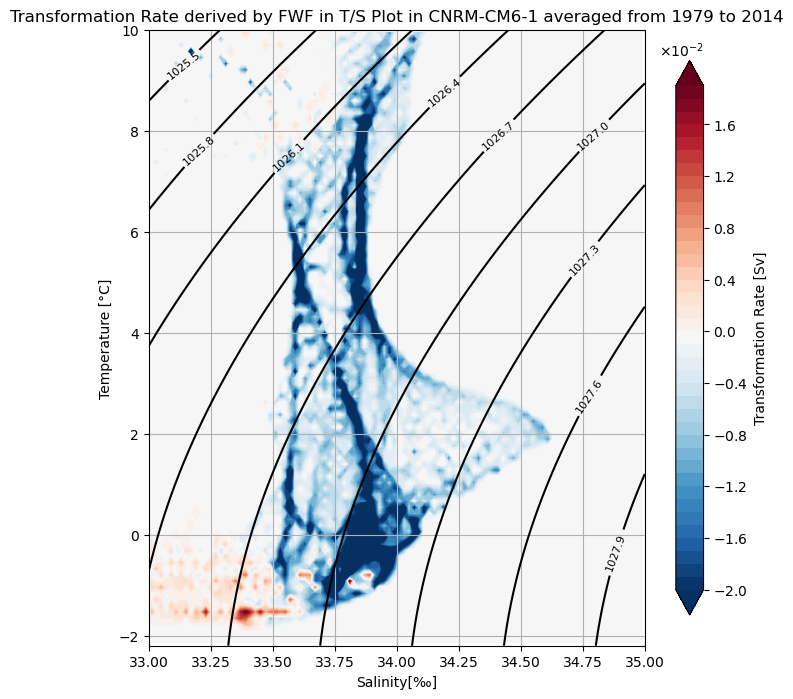

<Figure size 640x480 with 0 Axes>

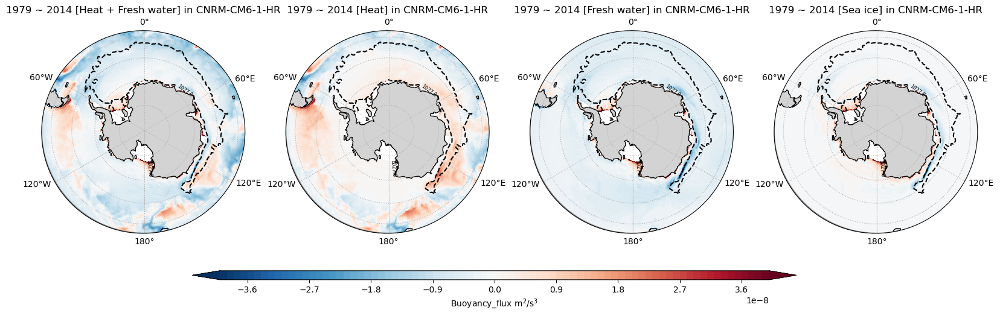

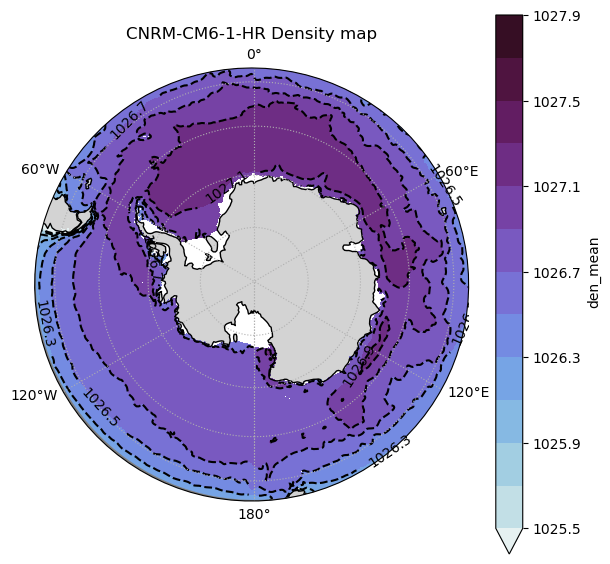

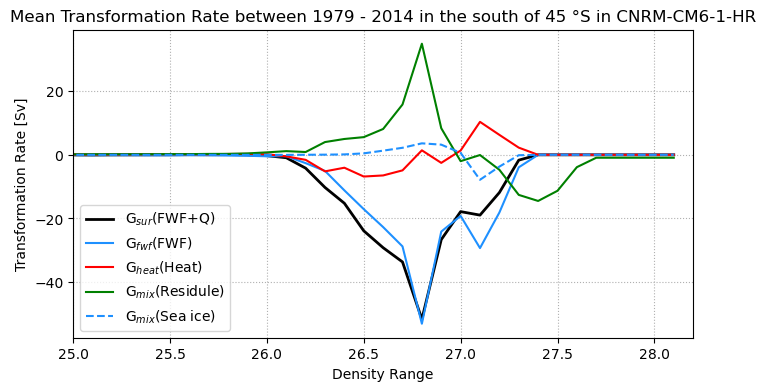

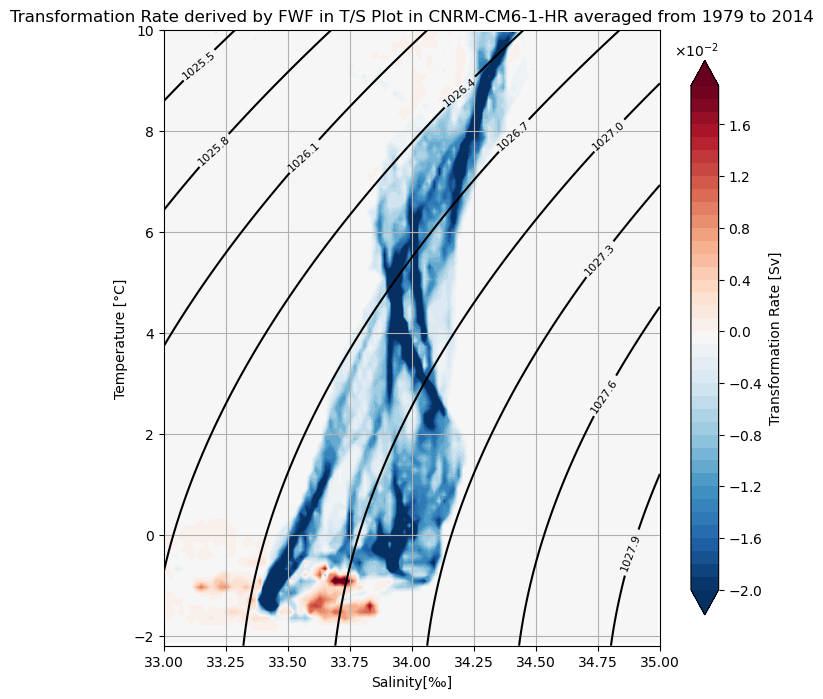

<Figure size 640x480 with 0 Axes>

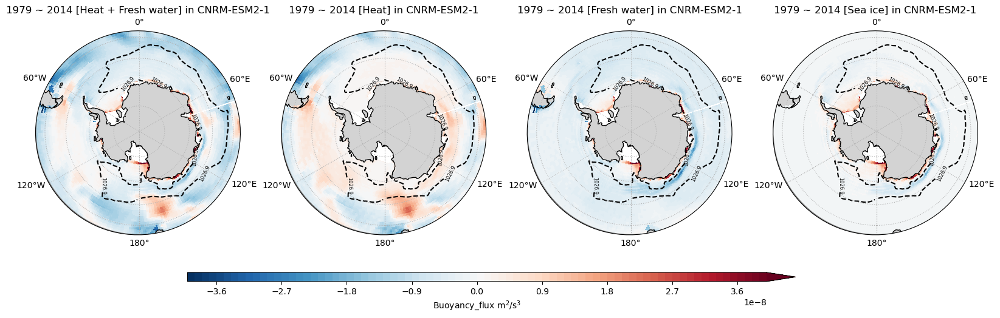

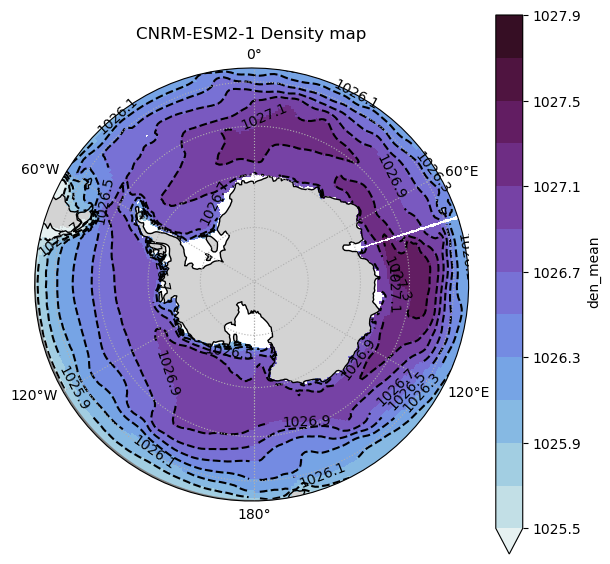

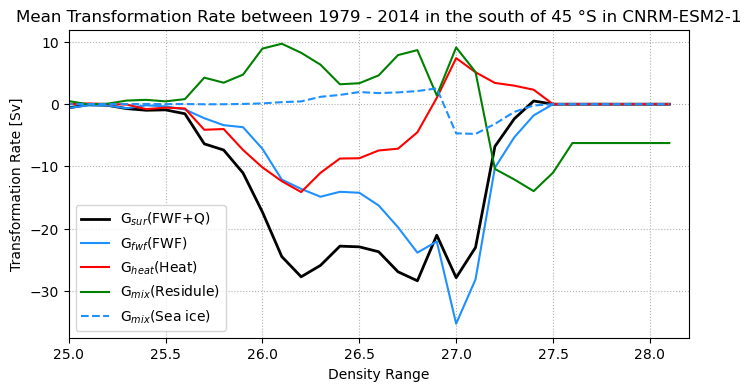

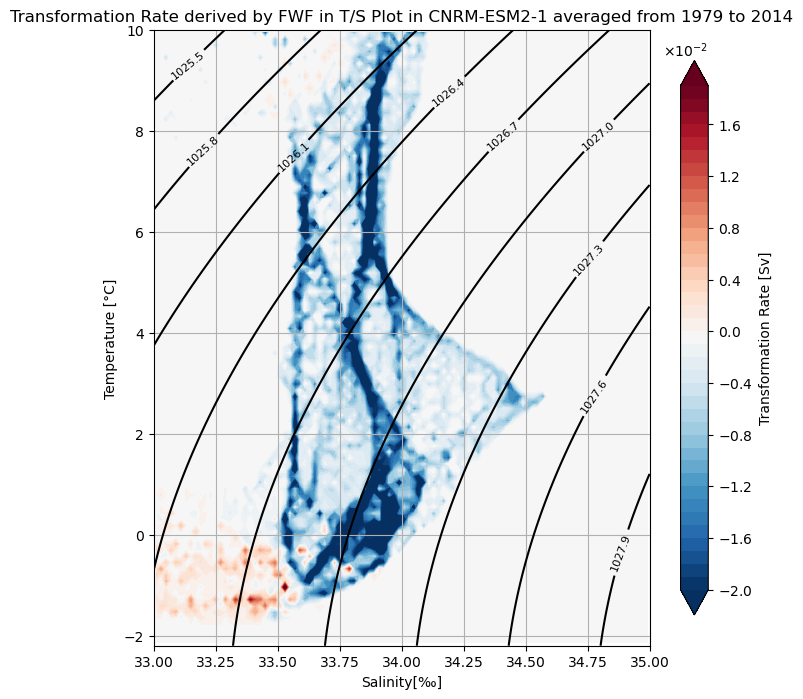

<Figure size 640x480 with 0 Axes>

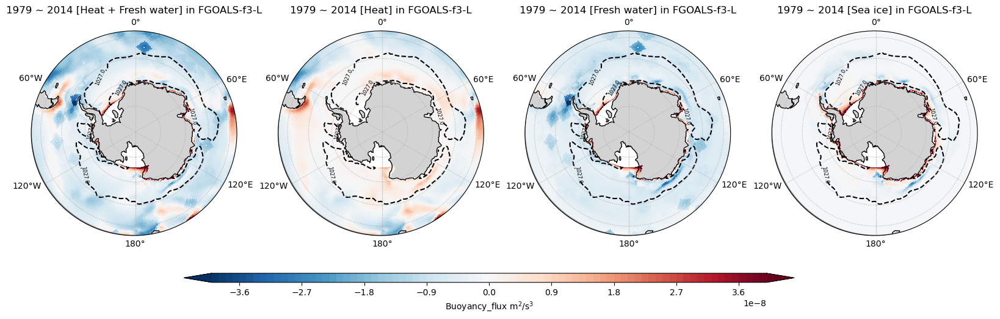

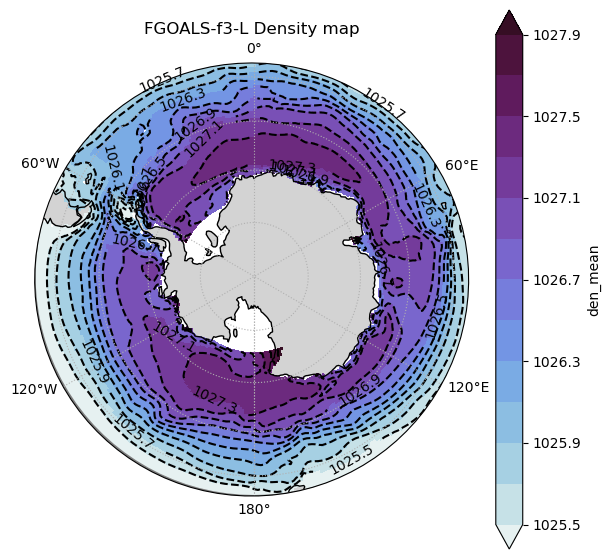

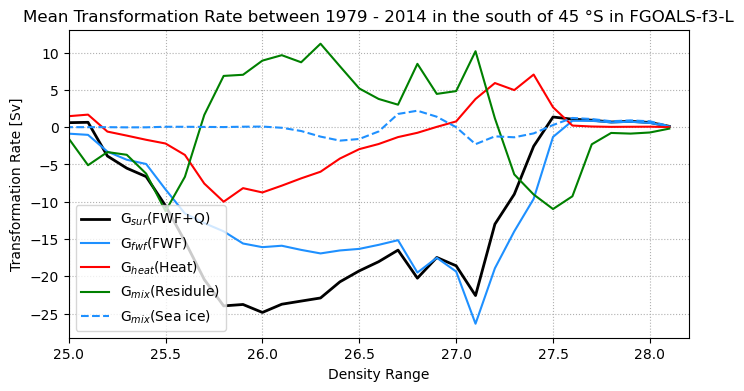

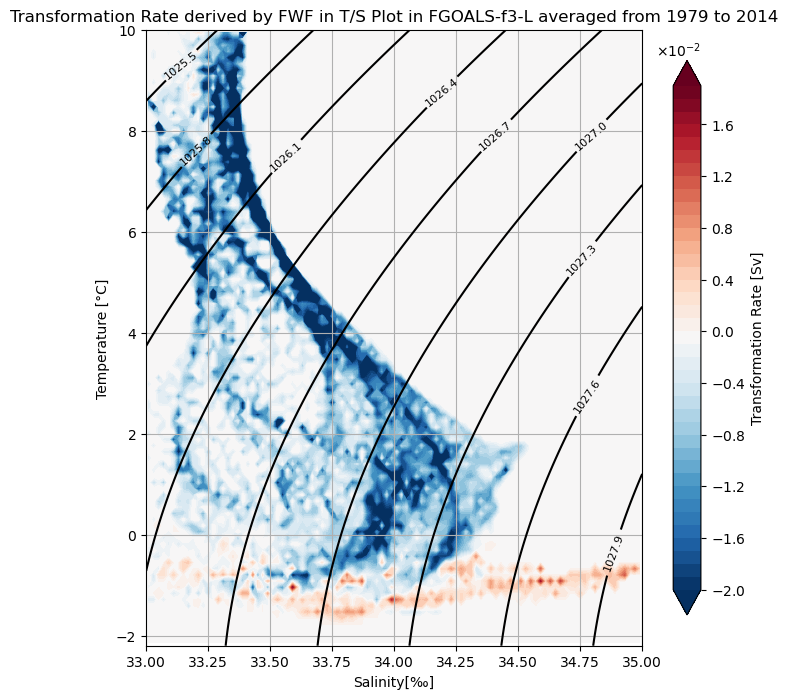

<Figure size 640x480 with 0 Axes>

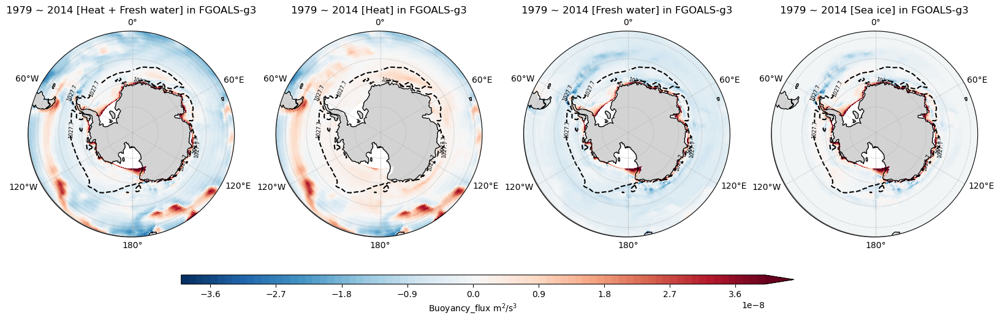

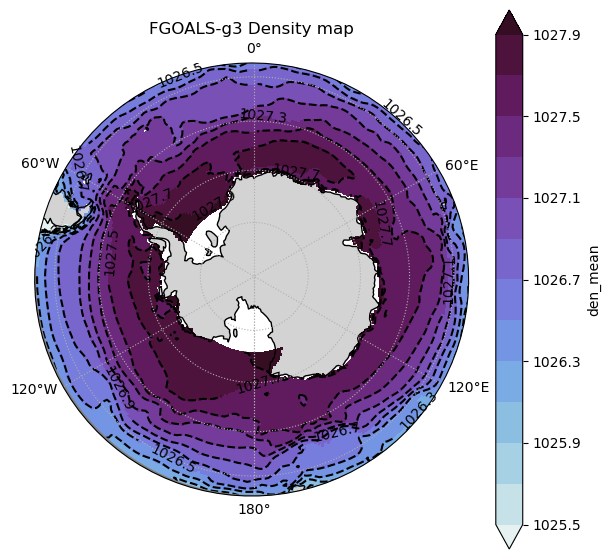

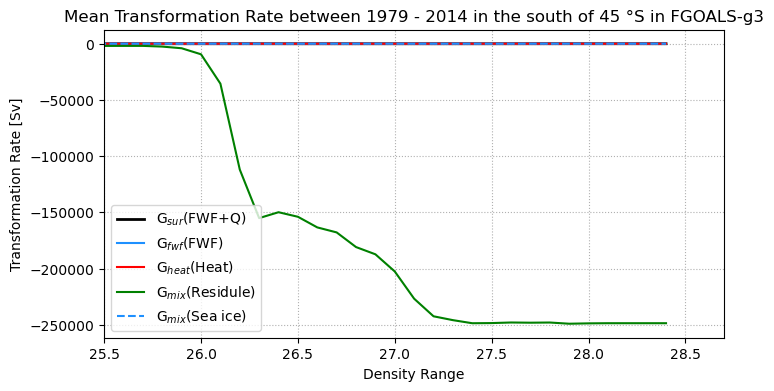

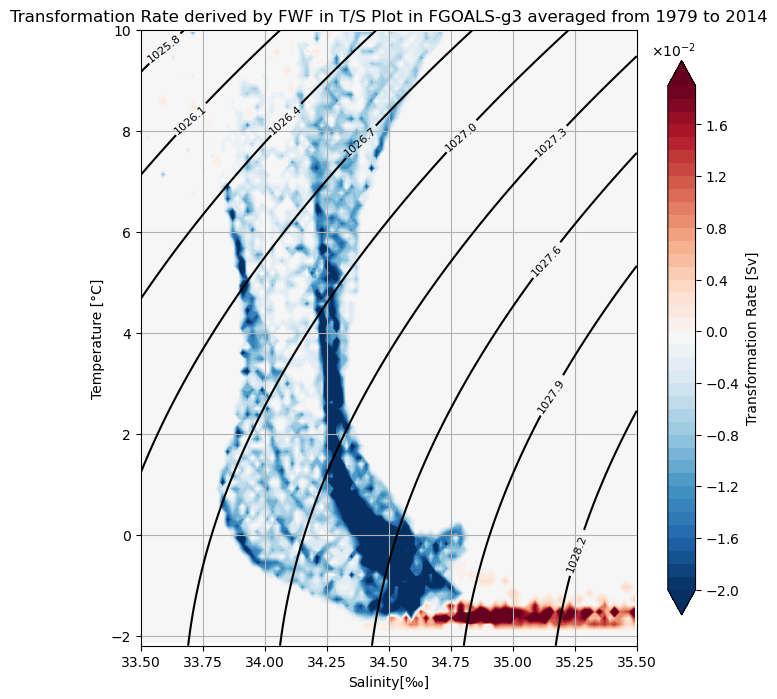

<Figure size 640x480 with 0 Axes>

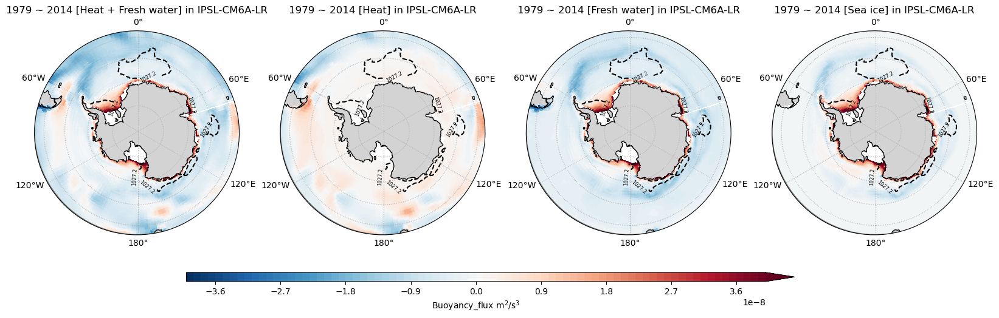

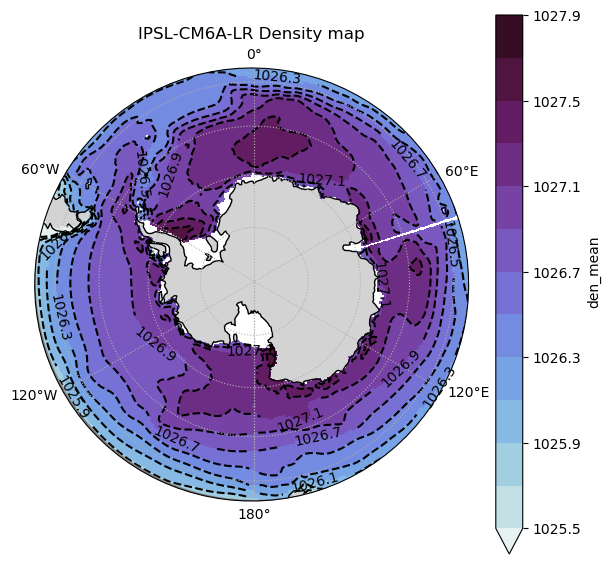

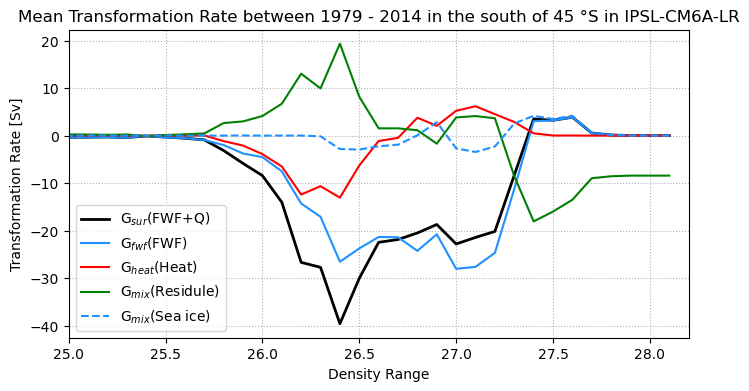

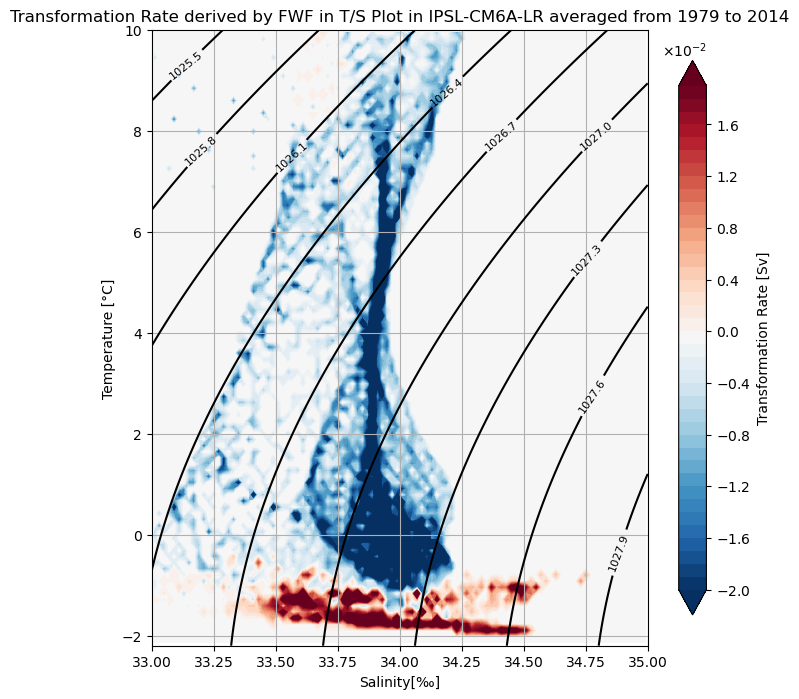

<Figure size 640x480 with 0 Axes>

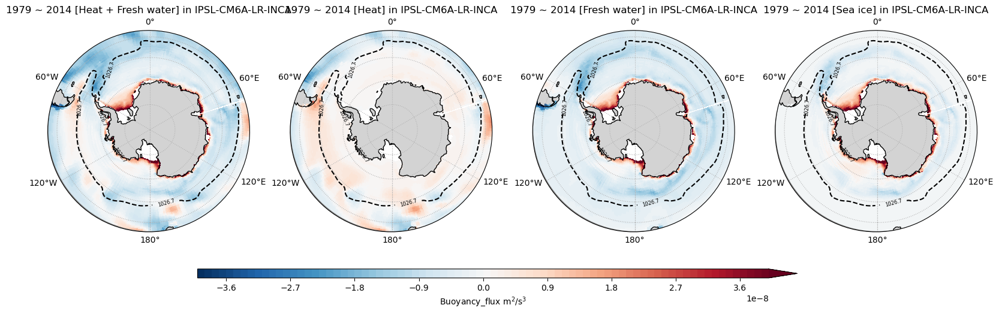

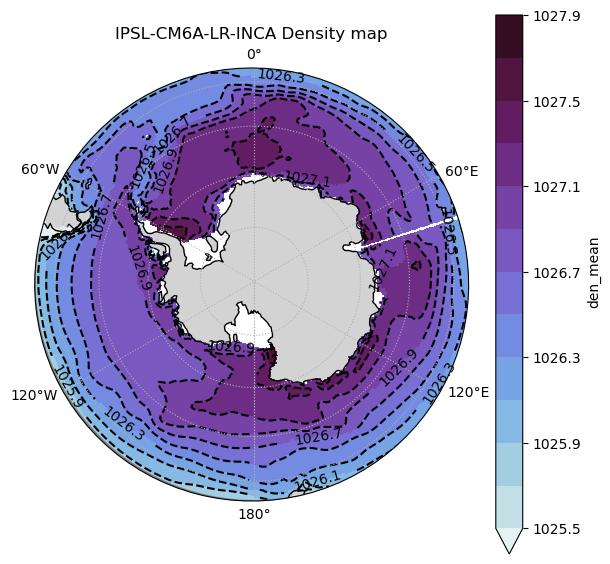

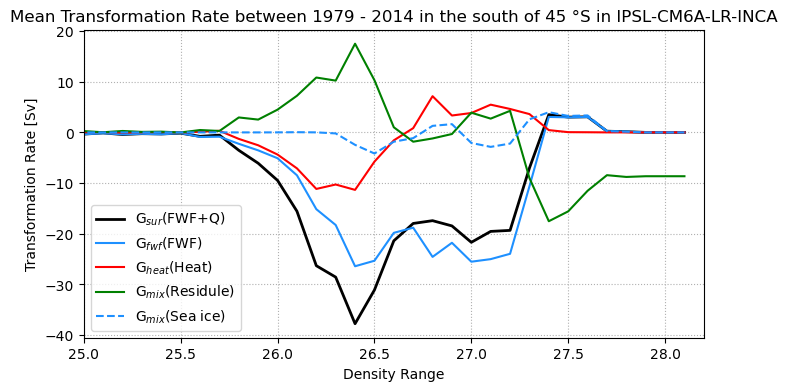

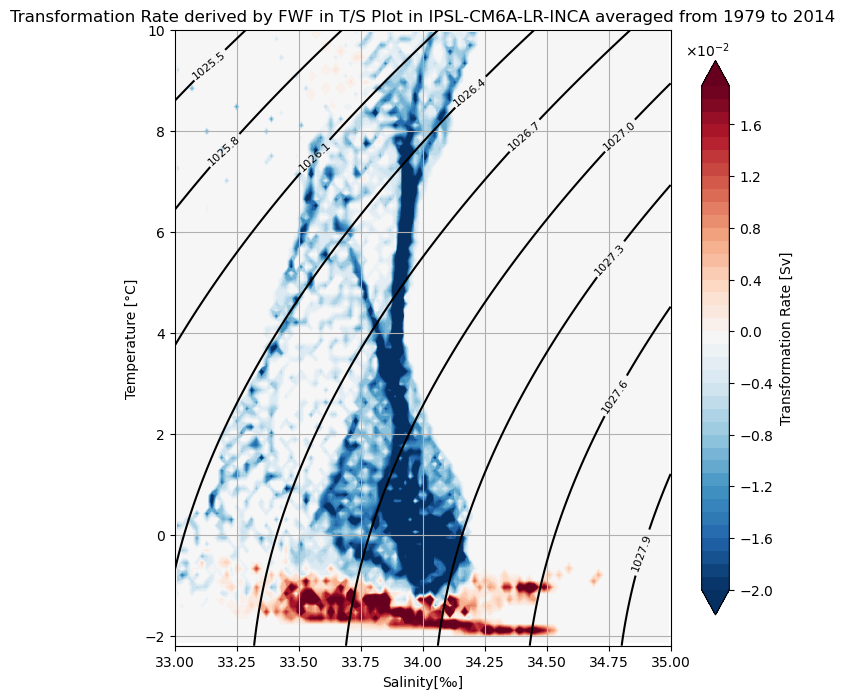

<Figure size 640x480 with 0 Axes>

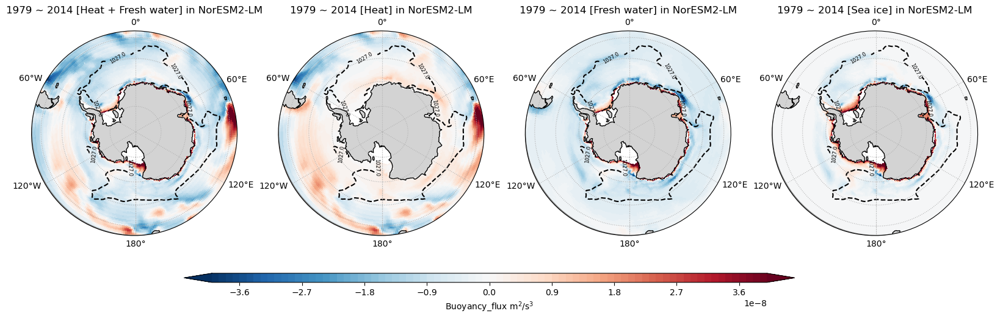

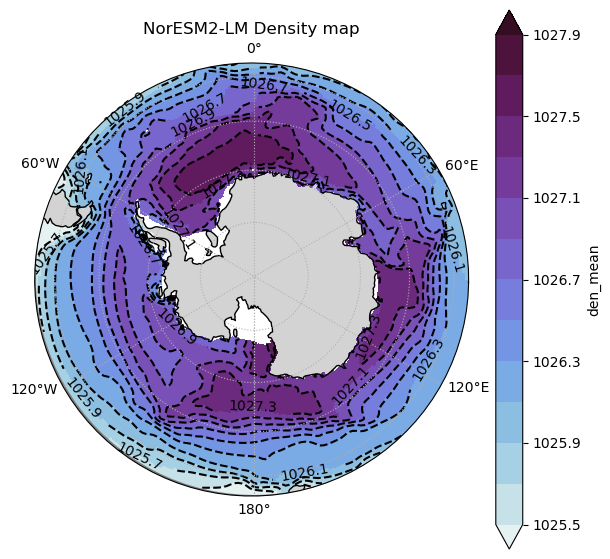

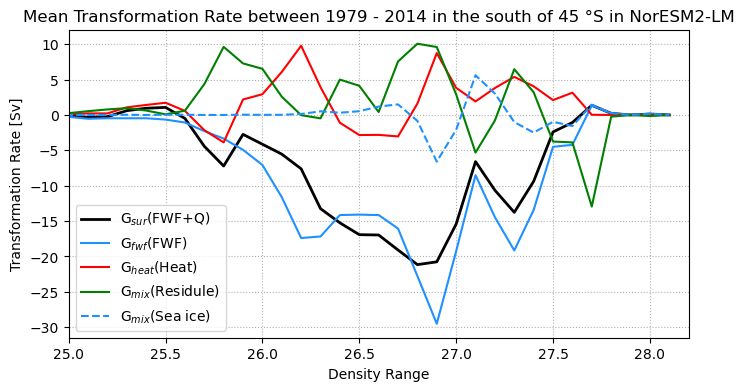

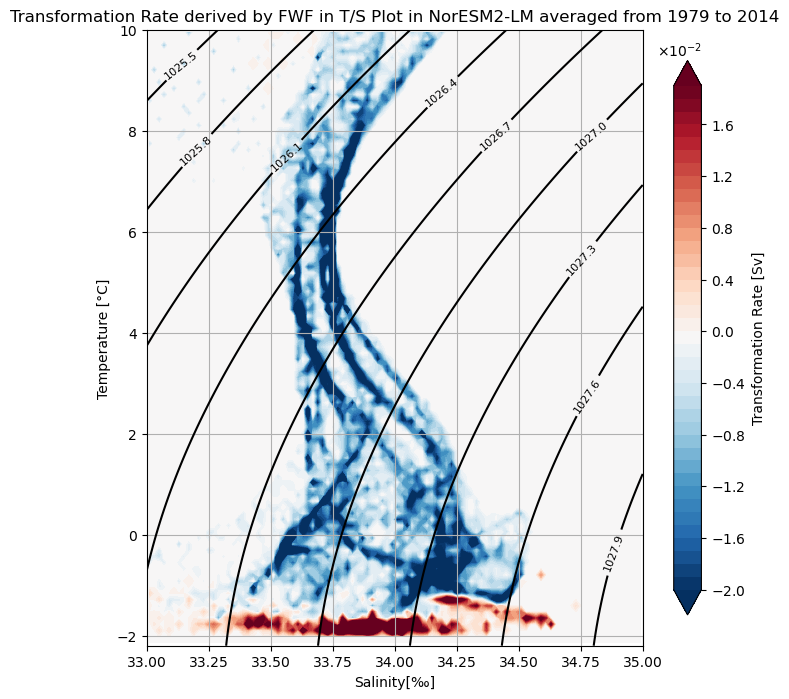

<Figure size 640x480 with 0 Axes>

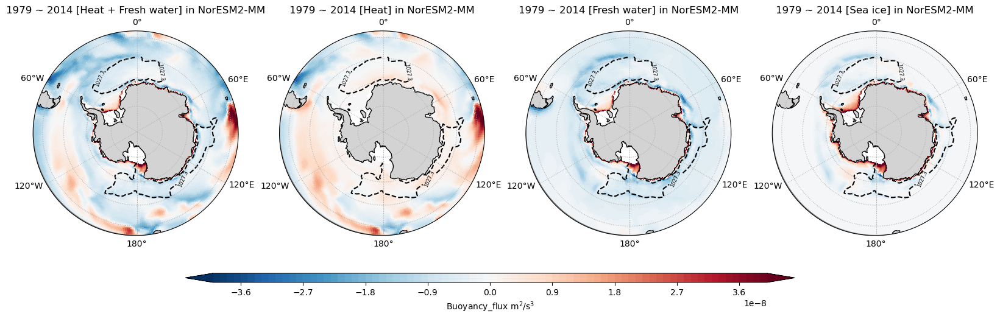

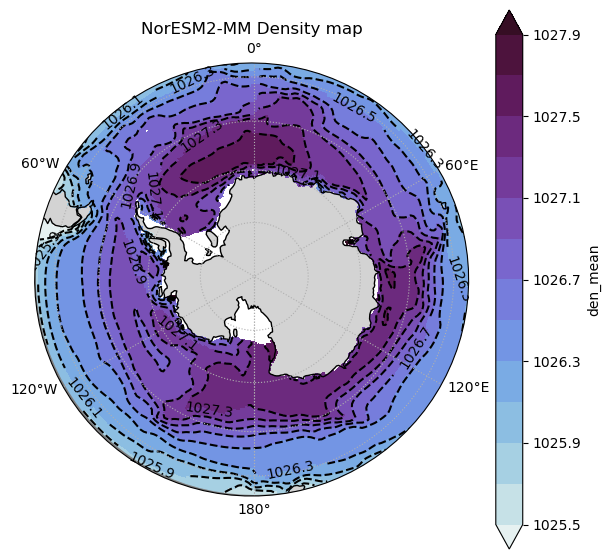

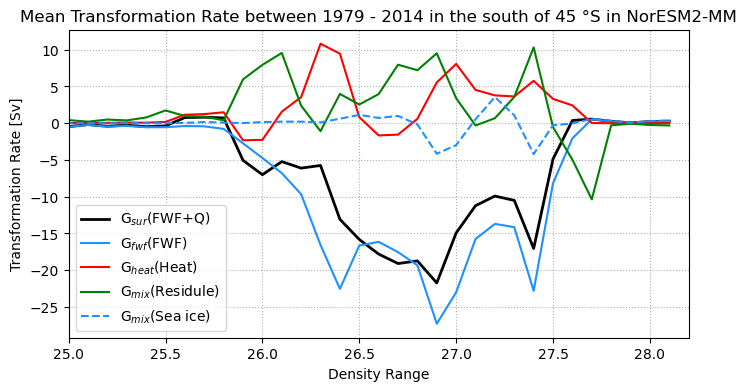

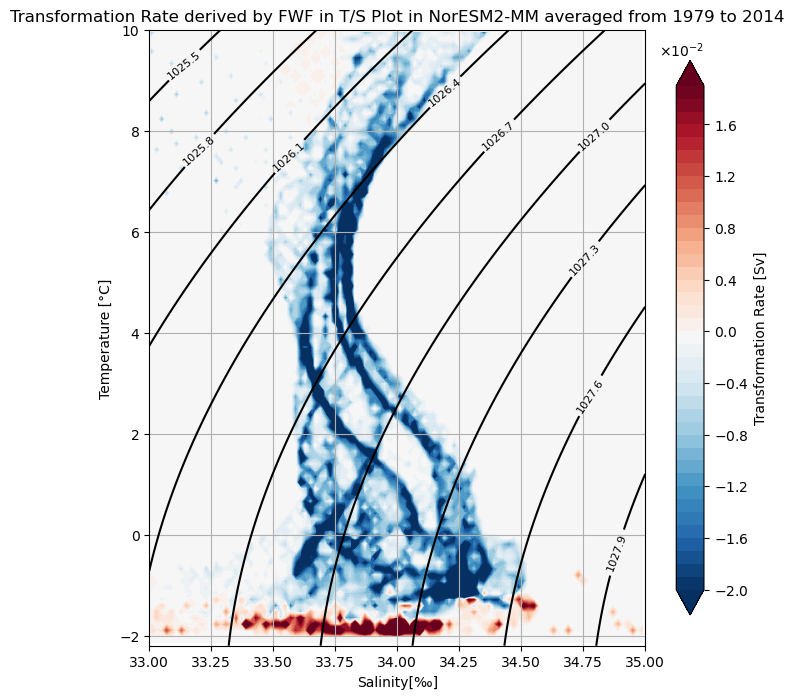

<Figure size 640x480 with 0 Axes>

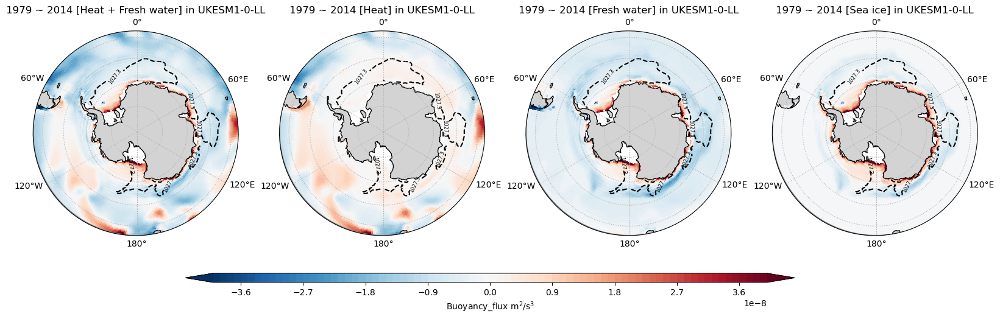

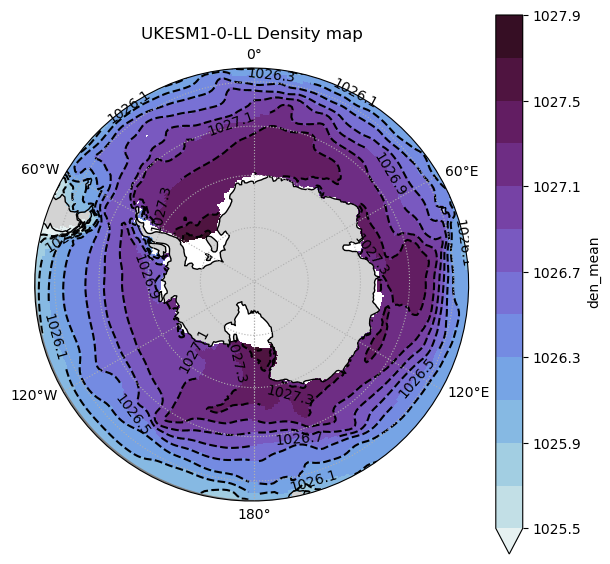

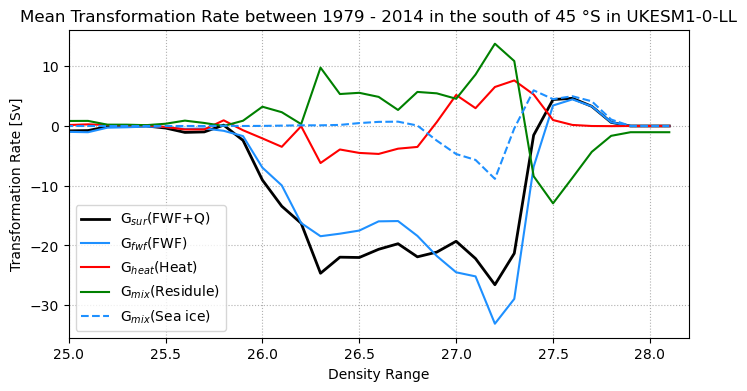

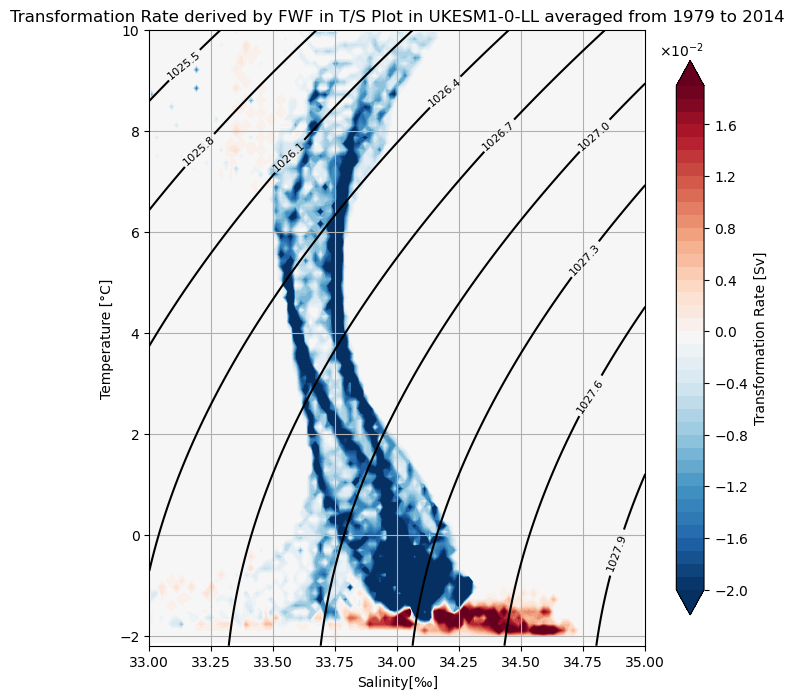

<Figure size 640x480 with 0 Axes>

In [7]:
for Model in model_list:

    tr_data = xr.open_dataset(f'/g/data/jk72/zc0441/Subject_1/Data/Transf_{Model}_{Time_range[0]}_{Time_range[1]}.nc')
    buo_data = xr.open_dataset(f'/g/data/jk72/zc0441/Subject_1/Data/Buo_{Model}_{Time_range[0]}_{Time_range[1]}.nc')
    ts_data = xr.open_dataset(f'/g/data/jk72/zc0441/Subject_1/Data/TS_{Model}_{Time_range[0]}_{Time_range[1]}.nc')

    fig_path = '/g/data/jk72/zc0441/Figures/20230802/'

    data_list = [buo_data.buo_year, buo_data.buo_hf_year, buo_data.buo_fwf_year, buo_data.buo_si_year]
    den_mean = buo_data.den_mean
    lon_key = buo_data.lon_key
    lat_key = buo_data.lat_key
    lat_edge = buo_data.lat_edge
    yrst = buo_data.yrst
    yren = buo_data.yren
    contour_density_value = [buo_data.fwf_si_flip_den]
    nearest_index = buo_data.nearest_index
    title_list = [' [Heat + Fresh water]' , ' [Heat]', ' [Fresh water]', ' [Sea ice]']
    model = buo_data.model

    fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 10),
                            subplot_kw=dict(projection=ccrs.Orthographic(0, -90)) #,facecolor="gray"
                           )

    for index, data in enumerate(data_list):

        fig1 = data.plot(x = lon_key,y = lat_key,
                        transform=ccrs.PlateCarree(),
                        levels = np.arange(-4e-8, 4.01e-8, 1e-9), 
                        add_colorbar=False,
                        ax = axs[index]
                        )

        #== Plot the density contour  
        # The raw data is not flat, flaten the density data and get rid of the abnomal column
        den_sorted = den_mean.sortby(den_mean[lon_key][nearest_index,:])
        den_sorted = den_sorted.sortby(den_sorted[lat_key][:,0])
        if len(den_sorted[0,:]) > 600:
            den_filtered = den_sorted[:,5:-5]
        else:
            den_filtered = den_sorted[:,1:-1] 
            # den_filtered = den_sorted
        # den_filtered[lon_key] = den_filtered[lon_key]+180
        den_contour = den_filtered.plot.contour(x = lon_key, y=lat_key, levels=contour_density_value,
                                              ax = axs[index],
                                              transform=ccrs.PlateCarree(),
                                              colors = 'k',
                                              linestyles='dashed')


        ax = axs[index]
        ax.coastlines()
        ax.gridlines(linestyle = ':',draw_labels=True)
        ax.set_extent([-180, 180, -90, lat_edge], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.LAND, facecolor='lightgray') # add the land map
        ax.set_title( yrst + ' ~ ' + yren + title_list[index] + ' in ' + model)  # Set the title   
        ax.clabel(den_contour, inline=True, fontsize=6, inline_spacing=10, fmt='%.1f')  # Set the lable of the contour

        # Add solid line at 50°S latitude
        # Plot the line segment
        lon = np.linspace(-180, 180, 100)
        lat = np.full_like(lon, lat_edge)
        ax.plot(lon, lat, color='gray', linestyle='-', transform=ccrs.PlateCarree())
        theta = np.linspace(0, 2*np.pi, 100)
        center, radius = [0.5, 0.5], 0.5
        verts = np.vstack([np.sin(theta), np.cos(theta)]).T
        circle = mpath.Path(verts * radius + center)
        ax.set_boundary(circle, transform=ax.transAxes)

    cbar = fig.colorbar(fig1, ax=axs.ravel().tolist(), 
                        cax=fig.add_axes([0.25, 0.25, 0.5, 0.015]),
                        orientation = 'horizontal',
                       )
    cbar.set_label(data_list[0].standard_name + ' ' + data_list[0].units)

    # plt.tight_layout()
    plt.show()
    # if figure_plot_trigger:
    #     fig.savefig(fig_path + '1buo_' + model +'.png')

    # fig.savefig(fig_path + 'den_' + model +'.png')
    
        ###============density contour==========###
    level_map = np.arange(1025.5, 1027.9, 0.2)    
        
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7, 7),
                            subplot_kw=dict(projection=ccrs.Orthographic(0, -90)) #,facecolor="gray"
                           )
    cs = den_mean.plot(x = lon_key,y = lat_key,
                            transform=ccrs.PlateCarree(),
                            levels = level_map, 
                            add_colorbar=True,
                            cmap=cm.dense
                            )

    contours = den_filtered.plot.contour(x=lon_key, y=lat_key, 
                                         levels = level_map,
                                          transform=ccrs.PlateCarree(),
                                          colors = 'k',
                                          linestyles='dashed')
    # Label the contour lines with density values
    plt.clabel(contours, inline=True, fontsize=10, fmt='%.1f', inline_spacing=5,
               rightside_up=True, use_clabeltext=True, colors='black', manual=False)

    ax.coastlines()
    ax.gridlines(linestyle = ':',draw_labels=True)
    ax.set_extent([-180, 180, -90, lat_edge], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray') # add the land map
        # Add solid line at 50°S latitude
    # Plot the line segment
    lon = np.linspace(-180, 180, 100)
    lat = np.full_like(lon, lat_edge)
    ax.plot(lon, lat, color='gray', linestyle='-', transform=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    ax.set_title(f'{model} Density map')
    
    #### =================Transportation Plot=============####

    # Plot of the tansformation rate 
    yrst = tr_data.yrst
    yren = tr_data.yren
    lat_edge = tr_data.lat_edge 
    model = tr_data.model
    fig_title = f'Mean Transformation Rate between {yrst} - {yren} in the south of {str(abs(lat_edge))} °S in {model}'

    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(8, 4))

    ax = axs
    # ax.plot(density_range, tr_list_all, label='G$_{sur}$(FWF+Q)',linewidth=2, color = 'black')
    tr_data['tr_list_all'].plot(label='G$_{sur}$(FWF+Q)',linewidth=2, color = 'black')
    tr_data['tr_list_fwf'].plot(label='G$_{fwf}$(FWF)',color = 'dodgerblue')
    tr_data['tr_list_hf'].plot(label='G$_{heat}$(Heat)',color = 'r')
    # tr_data['tr_list_tran'].plot(label='M$_{45°S}$(Water volume transportation)',color = 'y')
    tr_data['tr_list_mix'].plot(label='G$_{mix}$(Residule)',color = 'g')
    tr_data['tr_list_sith'].plot(label='G$_{mix}$(Sea ice)',color = 'dodgerblue', linestyle = '--')
    # ax.plot(density_range, tr_list_hf, label='G$_{heat}$(Heat)',color = 'r')
    # ax.plot(density_range, tr_list_tran, label='M$_{45°S}$(Water volume transportation)',color = 'y')
    # ax.plot(density_range, tr_list_mix, label='G$_{mix}$(Residule)',color = 'g')

    # ax2 = ax.twinx()
    # tr_data['tr_list_sic'].plot(label='Sea ice area', color='gray', linestyle = '--')
    # # ax2.plot(density_range, tr_list_sic, label='Sea ice area', color='gray', linestyle = '--')
    # ax2.set_ylabel('Accumulated Sea ice Area[km$^{2}$]')# ax.plot(density_range, tr_list_sic, label='sic')



    # Add a legend
    ax.legend(loc= 'lower left')
    # ax2.legend(loc='lower right')

    # Add a grid
    ax.grid(linestyle = ':')

    # Set the x and y axis labels
    ax.set_xlabel('Density Range')
    ax.set_ylabel('Transformation Rate [Sv]')
    ax.set_title(fig_title)
    
    if model == 'FGOALS-g3':
        ax.set_xlim((25.5,28.7))
    else:
        ax.set_xlim((25,28.2))
    # ax.set_ylim(-40,40)

    
    ####====================TS Plot=============####
    # Define the latitude limit, salinity limit, and temperature limit
    lat_edge_1 = -45
    sal_lim = [33, 35]
    if model == 'FGOALS-g3':
        sal_lim = [33.5, 35.5]
    tem_lim = [-2.2, 10]

    # Filter the data based on latitude limit
    sal_p = ts_data.sal_p
    tem_p = ts_data.tem_p
    tr_sur_p = ts_data.tr_sur_p

    # Calculate density using gsw library
    pressure = 0  # Assuming surface pressure for simplicity
    den_p = gsw.rho(sal_p, tem_p, pressure)

    # Create a new grid to accumulate "tr_sur" values
    # Define the number of bins for salinity and temperature
    num_bins_sal = 100
    num_bins_tem = 100
    # The interval of the grid
    sal_interval = (sal_lim[-1]-sal_lim[0])/num_bins_sal
    tem_interval = (tem_lim[-1]-tem_lim[0])/num_bins_tem

    fig = plt.figure(figsize=(8, 8))
    # Calculate the 2D histogram-like bins
    hist2D, tem_edges , sal_edges= np.histogram2d(tem_p.values.flatten(),
                                                  sal_p.values.flatten(),
                                                  bins=[num_bins_sal, num_bins_tem],
                                                  range=[tem_lim,sal_lim],
                                                  weights=tr_sur_p.values.flatten())

    # Normalize the accumulated values by the number of occurrences in each bin to get the mean "tr_sur"
    # hist2D[hist2D == 0] = np.nan  # Set zero values to NaN to avoid division by zero

    # Create a density contour plot
    contour_plot = plt.contourf(sal_edges[:-1]+sal_interval/2, tem_edges[:-1]+tem_interval/2, # Plot the contour at the centre of the grid
                                hist2D,
                                cmap='RdBu_r',  # You can change the colormap as needed
                                levels=np.arange(-0.02, 0.02, 0.001),
                                extend='both' # Extend the value in cmap
                               )

    # Define the temperature and salinity ranges
    sal_range = np.linspace(sal_lim[0], sal_lim[1], 100)
    tem_range = np.linspace(tem_lim[0], tem_lim[1], 100)

    # Create a grid of temperature and salinity values
    temperature, salinity = np.meshgrid(tem_range, sal_range)

    # Calculate density using gsw library
    density = gsw.rho(salinity, temperature, pressure)

    # Create a density contour plot
    contour_lines = plt.contour(salinity, temperature, density, colors='k', levels=10)
    plt.clabel(contour_lines, inline=True, fontsize=8, fmt='%1.1f')  # Add labels to contour lines



    # Format color bar tick labels in scientific notation
    cbar = plt.colorbar(contour_plot,shrink=0.9)
    formatter = ticker.ScalarFormatter(useMathText=True)
    formatter.set_powerlimits((-1, 1))  # Set the power limits to show scientific notation from -3 to 3
    cbar.formatter = formatter
    cbar.update_ticks()
    cbar.set_label('Transformation Rate [Sv]')

    # cbar.ax.yaxis.set_offset_position('right')
    # cbar.ax.yaxis.get_offset_text().set_x(3.5) 


    # Labels and title
    plt.xlabel('Salinity[‰]')
    plt.ylabel('Temperature [°C]')
    plt.title(f'Transformation Rate derived by FWF in T/S Plot in {model} averaged from {yrst} to {yren}')

    # Set the plot limits
    plt.xlim(sal_lim)
    plt.ylim(tem_lim)

    plt.grid(True)
    plt.show()

    if save_fig_trigger:
        plt.savefig(f'{fig_path}TS_{model}.png')

In [4]:
# df.variable_paths('ACCESS-CM2')

In [5]:
# df.model_list()

In [6]:
# variable_list = ['tos', 'sos', 'hfds', 'wfo' ,'vmo', 'so' ,'thetao']
# variable_list_si = ['siconc', 'sivols'] # 'sispeed'


# frequency = ['mon']
# experiment = ['historical']
# member_id = ['r1i1p1f1', 'r1i1p1f2']
# realm = ['ocean']
# grid_label = ['gn']

# yrst = '1990'; yren = '1999'
# lat_edge = -45

# figure_plot_trigger = False
# file_path = '/g/data/jk72/zc0441/Subject_1/model_list.json'
# fig_path = '/g/data/jk72/zc0441/Figures/20230626/'


In [7]:
# # constraint = {'variable_id': variable_list,'frequency': frequency, 'realm': realm ,'member_id': member_id, 'experiment_id': experiment,'grid_label':grid_label}
# constraint_si = {'variable_id': variable_list_si,'frequency': frequency, 'member_id': member_id, 'experiment_id': experiment,'grid_label':grid_label}
# # df = Zsearch(constraint)
# df_si = Zsearch(constraint_si)
# df_si.show()

In [8]:
#f'{file_list[0]}/*.nc'

In [9]:
model

'UKESM1-0-LL'